# **QUANTUM COMPUTERS** - IBEX35

In [1]:
pip install yfinance

Instalar librerías

In [2]:
import yfinance as yf
import pandas as pd

In [3]:
import seaborn as sns
import matplotlib.pyplot as plt

In [4]:
import numpy as np
from scipy.optimize import minimize
from itertools import combinations

Lista de as empresas del IBEX35 2024

In [5]:
ibex35_tickers = [
    "ANA.MC",   # Acciona
    "ACX.MC",   # Acerinox
    "ACS.MC",   # ACS
    "AENA.MC",  # Aena
    "ALM.MC",   # Almirall
    "AMS.MC",   # Amadeus IT Group
    "ANA.MC",   # Acciona Energía
    "BBVA.MC",  # BBVA
    "CABK.MC",  # CaixaBank
    "CLNX.MC",  # Cellnex Telecom
    "DIA.MC",   # Distribuidora Internacional de Alimentación (DIA)
    "EBRO.MC",  # Ebro Foods
    "ELE.MC",   # Endesa
    "ENG.MC",   # Enagás
    "FER.MC",   # Ferrovial
    "GRF.MC",   # Grifols
    "IBE.MC",   # Iberdrola
    "IDR.MC",   # Indra
    "ITX.MC",   # Inditex
    "COL.MC",   # Inmobiliaria Colonial
    "LOG.MC",   # Logista
    "MAP.MC",   # Mapfre
    "MEL.MC",   # Meliá Hotels
    "MRL.MC",   # Merlin Properties
    "NTGY.MC",  # Naturgy (Gas Natural)
    "PHM.MC",   # PharmaMar
    "REE.MC",   # Red Eléctrica
    "REP.MC",   # Repsol
    "ROVI.MC",  # Rovi
    "SAB.MC",   # Banco Sabadell
    "SAN.MC",   # Banco Santander
    "SGRE.MC",  # Siemens Gamesa
    "SLR.MC",   # Solaria
    "TEF.MC",   # Telefónica
    "VIS.MC"    # Viscofan
]


Definir el rango de fechas

In [6]:
start_date = "2024-01-01"
end_date = "2024-12-31"

Descargar datos:

In [7]:
ibex35_data = yf.download(ibex35_tickers, start=start_date, end=end_date, group_by='ticker')

YF.download() has changed argument auto_adjust default to True


[*********************100%***********************]  33 of 34 completed
ERROR:yfinance:
2 Failed downloads:
[*********************100%***********************]  33 of 34 completedERROR:yfinance:['SGRE.MC', 'REE.MC']: YFTzMissingError('possibly delisted; no timezone found')


Eliminar NaNs

In [8]:
# Eliminar las empresas con valores NaN en cualquier columna
clean_ibex35_data = ibex35_data.dropna(axis=1, how='any')

# Guardar los datos limpios a un archivo CSV
clean_ibex35_data.to_csv("clean_ibex35_2024.csv")

# Mostrar qué empresas han sido eliminadas
dropped_tickers = [col[0] for col in ibex35_data.columns if col[0] not in clean_ibex35_data.columns.get_level_values(0)]
print(f"Empresas eliminadas por NaN: {dropped_tickers}")


Empresas eliminadas por NaN: ['SGRE.MC', 'SGRE.MC', 'SGRE.MC', 'SGRE.MC', 'SGRE.MC', 'SGRE.MC', 'REE.MC', 'REE.MC', 'REE.MC', 'REE.MC', 'REE.MC', 'REE.MC']


In [9]:
# Mostrar las primeras filas de los datos limpios
clean_ibex35_data.head()

Ticker         VIS.MC                                            EBRO.MC  \
Price            Open       High        Low      Close Volume       Open   
Date                                                                       
2024-01-02  51.221706  51.507329  50.840878  51.221706  42697  14.695247   
2024-01-03  51.602540  51.697747  50.079216  50.079216  61053  14.789810   
2024-01-04  50.079217  51.316919  50.079217  51.126503  44985  14.770897   
2024-01-05  50.840883  51.221711  50.269635  50.650467  41277  14.751986   
2024-01-08  50.650464  51.602541  50.555254  51.412125  29482  14.657421   

Ticker                                              ...     PHM.MC             \
Price            High        Low      Close Volume  ...       Open       High   
Date                                                ...                         
2024-01-02  14.789811  14.676334  14.751986  40223  ...  41.102014  41.888278   
2024-01-03  14.865461  14.695246  14.714159  59170  ...  41.416519  42.065188   
2024-01-04  14.789810  14.676333  14.789810  39864  ...  41.337895  41.770340   
2024-01-05  14.770898  14.619596  14.676334  59607  ...  41.180641  41.318237   
2024-01-08  14.657421  14.525031  14.619596  63767  ...  41.003729  41.868618   

Ticker                                      ACS.MC                        \
Price             Low      Close Volume       Open       High        Low   
Date                                                                       
2024-01-02  40.590941  41.495148  38337  37.475786  37.996799  37.401354   
2024-01-03  41.180642  41.475491  40974  37.410662  37.503700  36.498889   
2024-01-04  40.787508  41.613087  34564  36.638445  37.168761  36.638445   
2024-01-05  40.296091  41.121670  31679  36.843131  37.047812  36.666358   
2024-01-08  40.767847  41.691708  26085  36.833825  37.243195  36.591926   

Ticker                         
Price           Close  Volume  
Date                           
2024-01-02  37.540913  290881  
2024-01-03  36.666359  698849  
2024-01-04  37.159458  385391  
2024-01-05  36.936169  282147  
2024-01-08  37.196674  310855  

[5 rows x 160 columns]

GRÁFICA VALORES DE CIERRE

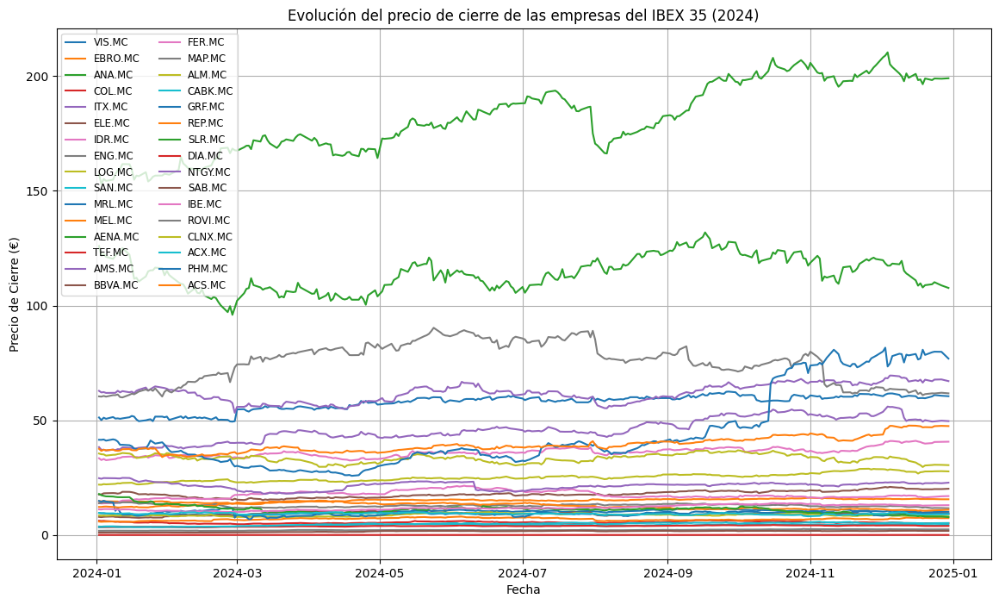

<Figure size 640x480 with 0 Axes>

In [10]:

# Extraer los precios de cierre de las empresas restantes
closing_prices = clean_ibex35_data.xs('Close', level=1, axis=1)

# Graficar cada empresa
plt.figure(figsize=(14, 8))

for ticker in closing_prices.columns:
    plt.plot(closing_prices.index, closing_prices[ticker], label=ticker)

plt.title('Evolución del precio de cierre de las empresas del IBEX 35 (2024)')
plt.xlabel('Fecha')
plt.ylabel('Precio de Cierre (€)')
plt.legend(loc='upper left', fontsize='small', ncol=2)
plt.grid()
plt.show()

# Guardar la gráfica
plt.savefig("ibex35_closing_prices.png", dpi=300)



GRÁFICA DE RETORNOS

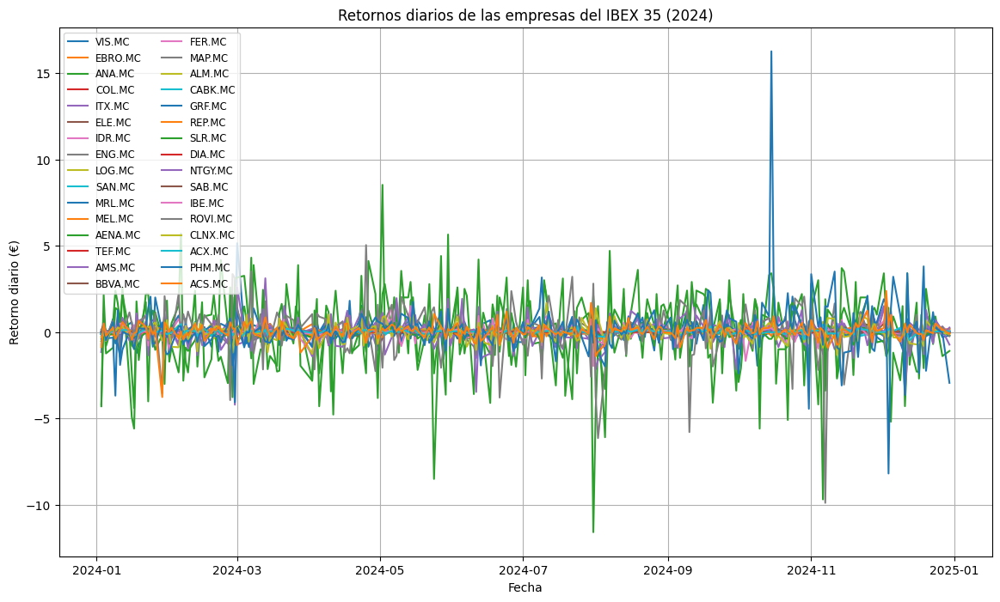

Empresas incluidas en las gráficas: ['VIS.MC', 'EBRO.MC', 'ANA.MC', 'COL.MC', 'ITX.MC', 'ELE.MC', 'IDR.MC', 'ENG.MC', 'LOG.MC', 'SAN.MC', 'MRL.MC', 'MEL.MC', 'AENA.MC', 'TEF.MC', 'AMS.MC', 'BBVA.MC', 'FER.MC', 'MAP.MC', 'ALM.MC', 'CABK.MC', 'GRF.MC', 'REP.MC', 'SLR.MC', 'DIA.MC', 'NTGY.MC', 'SAB.MC', 'IBE.MC', 'ROVI.MC', 'CLNX.MC', 'ACX.MC', 'PHM.MC', 'ACS.MC']


<Figure size 640x480 with 0 Axes>

In [11]:
# Calcular los retornos diarios como la diferencia entre el precio actual y el del día anterior
daily_returns = closing_prices.diff()


# Graficar los retornos diarios
plt.figure(figsize=(14, 8))
for ticker in daily_returns.columns:
    plt.plot(daily_returns.index, daily_returns[ticker], label=ticker)

plt.title('Retornos diarios de las empresas del IBEX 35 (2024)')
plt.xlabel('Fecha')
plt.ylabel('Retorno diario (€)')
plt.legend(loc='upper left', fontsize='small', ncol=2)
plt.grid()
plt.show()

# Guardar las gráficas como archivos PNG
plt.savefig("ibex35_daily_returns.png", dpi=300)

# Mostrar las empresas incluidas después de eliminar NaN
print(f"Empresas incluidas en las gráficas: {closing_prices.columns.tolist()}")


GRÁFICA DE BARRAS CON MEDIA DE RETORNO DE CADA EMPRESA.

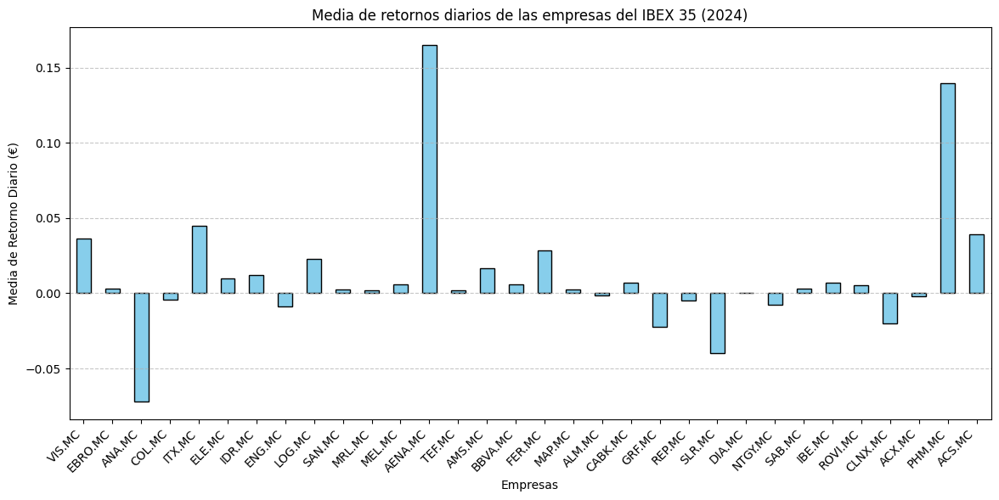

Ticker
VIS.MC     0.036529
EBRO.MC    0.003199
ANA.MC    -0.072058
COL.MC    -0.004151
ITX.MC     0.044679
ELE.MC     0.009983
IDR.MC     0.012065
ENG.MC    -0.008536
LOG.MC     0.022746
SAN.MC     0.002766
MRL.MC     0.001977
MEL.MC     0.005889
AENA.MC    0.164836
TEF.MC     0.002178
AMS.MC     0.016744
BBVA.MC    0.005854
FER.MC     0.028414
MAP.MC     0.002348
ALM.MC    -0.001527
CABK.MC    0.007022
GRF.MC    -0.022346
REP.MC    -0.004649
SLR.MC    -0.039626
DIA.MC     0.000013
NTGY.MC   -0.007661
SAB.MC     0.002968
IBE.MC     0.007253
ROVI.MC    0.005276
CLNX.MC   -0.019882
ACX.MC    -0.002180
PHM.MC     0.139389
ACS.MC     0.039107
dtype: float64


In [12]:
# Calcular la media de retorno de cada empresa
mean_returns = daily_returns.mean()

# Crear una gráfica de barras
plt.figure(figsize=(14, 6))
mean_returns.plot(kind='bar', color='skyblue', edgecolor='black')

plt.title('Media de retornos diarios de las empresas del IBEX 35 (2024)')
plt.xlabel('Empresas')
plt.ylabel('Media de Retorno Diario (€)')
plt.xticks(rotation=45, ha='right')  # Rotar los nombres de las empresas para mejor visualización
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Guardar la gráfica
plt.savefig("ibex35_mean_returns.png", dpi=300)

plt.show()

# Mostrar la media de retorno calculada
print(mean_returns)


HEATMAP COVARIANZA DE LOS RETORNOS

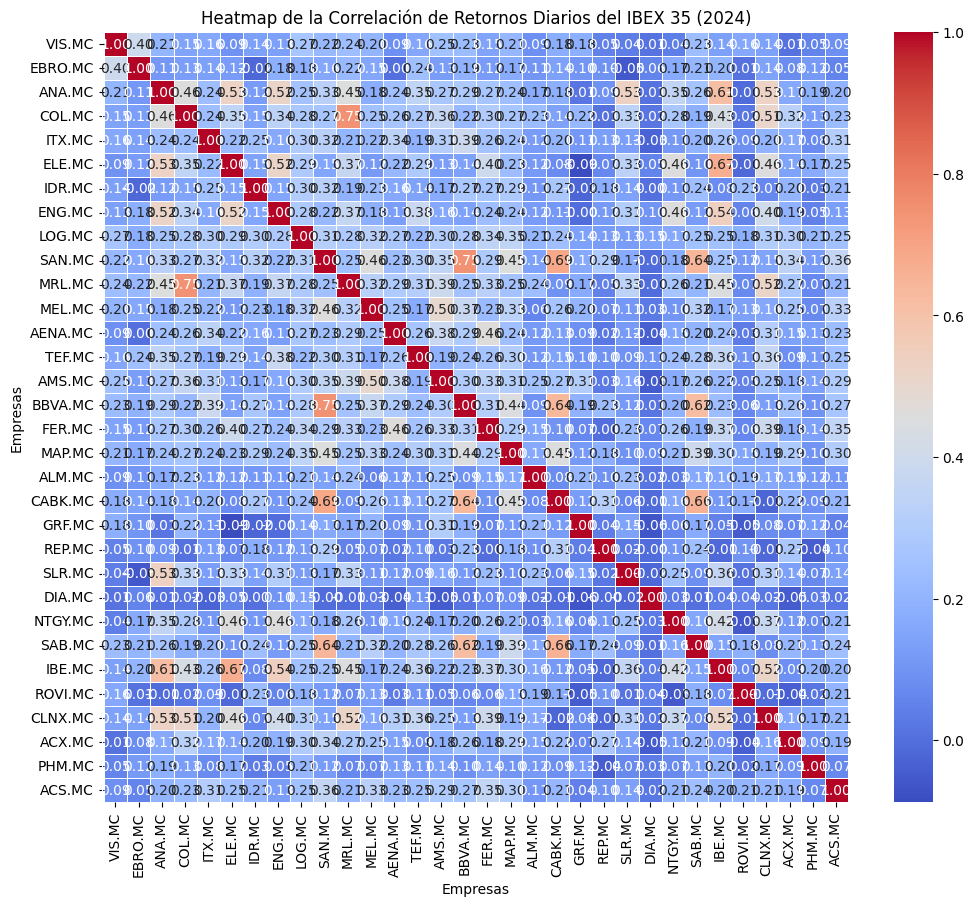

In [13]:
# Calcular la matriz de covarianza
cov_matrix = daily_returns.cov()

# Calcular la matriz de correlación (normalización)
std_devs = daily_returns.std()  # Desviación estándar de cada acción
corr_matrix = cov_matrix / (std_devs.values[:, None] * std_devs.values[None, :])

# Crear un heatmap de la matriz de correlación
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm', linewidths=0.5)

plt.title('Heatmap de la Correlación de Retornos Diarios del IBEX 35 (2024)')
plt.xlabel('Empresas')
plt.ylabel('Empresas')

# Guardar la gráfica
plt.savefig("ibex35_correlation_heatmap.png", dpi=300)

plt.show()


Descargar el csv

In [14]:
from google.colab import files
# Descargar el archivo CSV a tu máquina local
files.download("clean_ibex35_2024.csv")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Definimos la función:
$$ f(x) = ∑_{i}μ_{i}\dot\ x_{i} - q∑_{i}∑_{j}x_{i} \dot\ COVMATRIX \dot\ x_{j} $$

Queremos probar todas las combinaciones posibles de empresas para 5 empresas. Y utilizar la combinación de empresas que tenga f(x) máximo.

In [15]:
# Definir el valor de q
q = 0.5

In [16]:
# Generar todas las combinaciones posibles de 5 empresas (en este caso solo hay una combinación)
combinations_list = list(combinations(ibex35_tickers, 5))  # Para este caso solo hay una combinación

In [17]:
from itertools import combinations

# Generar combinaciones únicas sin importar el orden
unique_combinations = {frozenset(comb) for comb in combinations(ibex35_tickers, 5)}

# Convertir de nuevo a una lista de tuplas si es necesario
combinations_list = [tuple(comb) for comb in unique_combinations]

print(combinations_list)


[('ELE.MC', 'AMS.MC', 'REP.MC', 'NTGY.MC', 'LOG.MC'), ('EBRO.MC', 'SLR.MC', 'ENG.MC', 'SGRE.MC', 'REE.MC'), ('CABK.MC', 'IDR.MC', 'ROVI.MC', 'MAP.MC', 'LOG.MC'), ('VIS.MC', 'PHM.MC', 'ITX.MC', 'NTGY.MC', 'FER.MC'), ('AMS.MC', 'ACS.MC', 'MAP.MC', 'FER.MC', 'LOG.MC'), ('ACX.MC', 'MRL.MC', 'COL.MC', 'NTGY.MC', 'IDR.MC'), ('SLR.MC', 'SAB.MC', 'IBE.MC', 'IDR.MC', 'SAN.MC'), ('ACX.MC', 'MRL.MC', 'ITX.MC', 'ACS.MC', 'ROVI.MC'), ('MEL.MC', 'PHM.MC', 'ANA.MC', 'COL.MC', 'BBVA.MC'), ('ALM.MC', 'ITX.MC', 'MAP.MC', 'FER.MC', 'CLNX.MC'), ('ACX.MC', 'REP.MC', 'DIA.MC', 'BBVA.MC', 'MAP.MC'), ('CLNX.MC', 'ROVI.MC', 'BBVA.MC', 'MAP.MC', 'REE.MC'), ('ACX.MC', 'CABK.MC', 'ENG.MC', 'ACS.MC', 'ROVI.MC'), ('ACX.MC', 'TEF.MC', 'ANA.MC', 'SAB.MC', 'FER.MC'), ('ACX.MC', 'COL.MC', 'GRF.MC', 'ROVI.MC', 'LOG.MC'), ('CABK.MC', 'ELE.MC', 'GRF.MC', 'MAP.MC', 'FER.MC'), ('VIS.MC', 'AENA.MC', 'REP.MC', 'ROVI.MC', 'LOG.MC'), ('ELE.MC', 'ITX.MC', 'SLR.MC', 'BBVA.MC', 'CLNX.MC'), ('VIS.MC', 'CABK.MC', 'ITX.MC', 'MAP.MC',

In [18]:
def objective_function(x, mean_returns, cov_matrix, q):
  sum_retorno = 0
  sum_riesgo = 0
  for i in range(5):
    for j in range(5):
      sum_retorno = sum_retorno + mean_returns[i] * x[i]
      sum_riesgo = sum_riesgo + x[i]*cov_matrix[i,j]*x[j]
  return sum_retorno - q*sum_riesgo


In [19]:
from itertools import combinations
import numpy as np

q = 0.5  # Parámetro de aversión al riesgo
num_empresas = 5  # Número de empresas en cada combinación

# Definir la función objetivo con NumPy
def objective_function(x, mean_returns, cov_matrix, q):
    sum_retorno = np.dot(mean_returns, x)  # Producto punto de mean_returns y x
    sum_riesgo = np.dot(x, np.dot(cov_matrix, x))  # x^T * COVMATRIX * x
    return sum_retorno - q * sum_riesgo

# Obtener la lista de empresas desde los datos
ibex35_tickers = mean_returns.index

# Generar combinaciones únicas de 5 empresas
unique_combinations = [list(comb) for comb in combinations(ibex35_tickers, num_empresas)]

# Evaluar la función para cada combinación
results = {}
for comb in unique_combinations:
    mean_returns_subset = mean_returns.loc[comb].values  # Extraer y convertir a array NumPy
    cov_matrix_subset = cov_matrix.loc[comb, comb].values  # Extraer submatriz y convertir a array NumPy

    x = np.ones(num_empresas)  # Vector de selección: todas las empresas en la combinación tienen un 1

    # Evaluar la función objetivo con NumPy
    result = objective_function(x, mean_returns_subset, cov_matrix_subset, q)
    results[tuple(comb)] = result

# Mostrar los resultados
for comb, res in results.items():
    print(f"Combinación: {comb}, Valor de la función objetivo: {res}")


Streaming output truncated to the last 5000 lines.
Combinación: ('BBVA.MC', 'CABK.MC', 'REP.MC', 'SAB.MC', 'PHM.MC'), Valor de la función objetivo: -1.1502647141186342
Combinación: ('BBVA.MC', 'CABK.MC', 'REP.MC', 'SAB.MC', 'ACS.MC'), Valor de la función objetivo: -0.16664548112516436
Combinación: ('BBVA.MC', 'CABK.MC', 'REP.MC', 'IBE.MC', 'ROVI.MC'), Valor de la función objetivo: -1.184838599419925
Combinación: ('BBVA.MC', 'CABK.MC', 'REP.MC', 'IBE.MC', 'CLNX.MC'), Valor de la función objetivo: -0.2320605739591109
Combinación: ('BBVA.MC', 'CABK.MC', 'REP.MC', 'IBE.MC', 'ACX.MC'), Valor de la función objetivo: -0.06940778819756865
Combinación: ('BBVA.MC', 'CABK.MC', 'REP.MC', 'IBE.MC', 'PHM.MC'), Valor de la función objetivo: -1.1830941845577985
Combinación: ('BBVA.MC', 'CABK.MC', 'REP.MC', 'IBE.MC', 'ACS.MC'), Valor de la función objetivo: -0.17667636190585206
Combinación: ('BBVA.MC', 'CABK.MC', 'REP.MC', 'ROVI.MC', 'CLNX.MC'), Valor de la función objetivo: -1.3223831038938343
Combina

La combinación cuyo valor es max es

In [20]:
# Encontrar la combinación con el valor máximo de la función objetivo
max_comb = max(results, key=results.get)
max_value = results[max_comb]

print(f"La mejor combinación es: {max_comb} con un valor de {max_value}")


La mejor combinación es: ('TEF.MC', 'MAP.MC', 'CABK.MC', 'DIA.MC', 'SAB.MC') con un valor de 0.006151776721710585


---
# QUANTUM SOLUTION

In [21]:
import numpy as np
np.random.seed(42)
x = np.random.choice([0, 1], size=10)
x = pd.Series(np.random.choice([0, 1], size=len(closing_prices.columns)), index=closing_prices.columns)


Funcion to optimize

In [22]:
mu = mean_returns
def f(x, mu, cov_matrix, q=0.1):
    x = np.asarray(x)
    mu = np.asarray(mu)
    cov_matrix = np.asarray(cov_matrix)

    benefit = np.dot(x, mu)
    risk = np.einsum('i,ij,j->', x, cov_matrix, x)

    return benefit - q * risk

f(x, mu, cov_matrix)

np.float64(-1.0491280464410107)

Under some restrictions

In [23]:
def restrictions(x):
    x = np.asarray(x)
    return bool(np.sum(x) <= 5)

restrictions(x)

False

We can use qiskit-optimization to build a qubo problem

In [24]:
pip install qiskit

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.5/6.5 MB 35.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.4/119.4 kB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 69.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.5/49.5 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.7/49.7 MB 19.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 109.0/109.0 kB 8.1 MB/s eta 0:00:00


In [25]:
pip install qiskit qiskit-optimization


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 645.5/645.5 kB 16.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 167.6/167.6 kB 11.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 310.5/310.5 kB 19.5 MB/s eta 0:00:00
  Created wheel for docplex: filename=docplex-2.29.241-py3-none-any.whl size=685423 sha256=bc20cee8ca777104e9943baf3d499d45c48a80e165060e2addd820b137985d19
  Stored in directory: /root/.cache/pip/wheels/00/4f/37/fbc42df1f9b6786024d4b39c81f0b373c84e6fab9e18513fc2
Successfully built docplex


In [26]:
import numpy as np
from qiskit_optimization import QuadraticProgram
from qiskit_optimization.converters import QuadraticProgramToQubo

def markowitz_qubo(mu, cov_matrix, q=0.1, max_assets=5):
    num_assets = len(mu)

    # Create a Quadratic Program
    qp = QuadraticProgram(name="Markowitz")

    # Define binary variables x_i (selecting an asset or not)
    for i in range(num_assets):
        qp.binary_var(f"x{i}")

    # Define the objective function: Minimize (- benefit + q * risk)
    linear_coeffs = -mu  # Corresponds to -x^T mu
    quadratic_coeffs = q * cov_matrix  # Corresponds to q x^T Σ x

    # Add to Qiskit's QuadraticProgram
    qp.maximize(linear=linear_coeffs, quadratic=quadratic_coeffs)
    qp.linear_constraint([1] * num_assets, "<=", max_assets, "max_assets_constraint")

    # Convert to QUBO
    converter = QuadraticProgramToQubo()
    qubo = converter.convert(qp)

    return qubo

# Create QUBO
qubo_problem = markowitz_qubo(np.asarray(mu), np.asarray(cov_matrix))

# Print QUBO formulation
print(qubo_problem.prettyprint())

Problem name: Markowitz

Minimize
  6.667586314594949*max_assets_constraint@int_slack@0^2
  + 26.670345258379797*max_assets_constraint@int_slack@0*max_assets_constraint@int_slack@1
  + 26.670345258379797*max_assets_constraint@int_slack@0*max_assets_constraint@int_slack@2
  + 26.670345258379797*max_assets_constraint@int_slack@1^2
  + 53.340690516759594*max_assets_constraint@int_slack@1*max_assets_constraint@int_slack@2
  + 26.670345258379797*max_assets_constraint@int_slack@2^2
  + 13.335172629189898*x0*max_assets_constraint@int_slack@0
  + 26.670345258379797*x0*max_assets_constraint@int_slack@1
  + 26.670345258379797*x0*max_assets_constraint@int_slack@2
  + 6.6177416158988125*x0^2 + 13.328547405274353*x0*x1
  + 13.330363751485196*x0*x10 + 13.332011656046873*x0*x11
  + 13.310065301954038*x0*x12 + 13.334366700075712*x0*x13
  + 13.307466428443501*x0*x14 + 13.329826656195063*x0*x15
  + 13.326000183533264*x0*x16 + 13.334406113033857*x0*x17
  + 13.333796082416626*x0*x18 + 13.333163362803889*x

In [27]:
op, offset = qubo_problem.to_ising()
print("offset: {}".format(offset))
print("operator:")
print(op)

offset: 1282.0704513456822
operator:
SparsePauliOp(['IIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIZ', 'IIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIZI', 'IIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIZII', 'IIIIIIIIIIIIIIIIIIIIIIIIIIIIIIIZIII', 'IIIIIIIIIIIIIIIIIIIIIIIIIIIIIIZIIII', 'IIIIIIIIIIIIIIIIIIIIIIIIIIIIIZIIIII', 'IIIIIIIIIIIIIIIIIIIIIIIIIIIIZIIIIII', 'IIIIIIIIIIIIIIIIIIIIIIIIIIIZIIIIIII', 'IIIIIIIIIIIIIIIIIIIIIIIIIIZIIIIIIII', 'IIIIIIIIIIIIIIIIIIIIIIIIIZIIIIIIIII', 'IIIIIIIIIIIIIIIIIIIIIIIIZIIIIIIIIII', 'IIIIIIIIIIIIIIIIIIIIIIIZIIIIIIIIIII', 'IIIIIIIIIIIIIIIIIIIIIIZIIIIIIIIIIII', 'IIIIIIIIIIIIIIIIIIIIIZIIIIIIIIIIIII', 'IIIIIIIIIIIIIIIIIIIIZIIIIIIIIIIIIII', 'IIIIIIIIIIIIIIIIIIIZIIIIIIIIIIIIIII', 'IIIIIIIIIIIIIIIIIIZIIIIIIIIIIIIIIII', 'IIIIIIIIIIIIIIIIIZIIIIIIIIIIIIIIIII', 'IIIIIIIIIIIIIIIIZIIIIIIIIIIIIIIIIII', 'IIIIIIIIIIIIIIIZIIIIIIIIIIIIIIIIIII', 'IIIIIIIIIIIIIIZIIIIIIIIIIIIIIIIIIII', 'IIIIIIIIIIIIIZIIIIIIIIIIIIIIIIIIIII', 'IIIIIIIIIIIIZIIIIIIIIIIIIIIIIIIIIII', 'IIIIIIIIIIIZIIIIIIIIIIIIIIIIIIIIIII', 'IIIIIIIIIIZ

In [28]:
from qiskit.circuit.library import RealAmplitudes
ansatz = RealAmplitudes(35, reps=2, entanglement="pairwise")
print(ansatz.decompose())

       ┌──────────┐     ┌───────────┐                  ┌───────────┐»
 q_0: ─┤ Ry(θ[0]) ├──■──┤ Ry(θ[35]) ├───────────────■──┤ Ry(θ[70]) ├»
       ├──────────┤┌─┴─┐└───────────┘┌───────────┐┌─┴─┐└───────────┘»
 q_1: ─┤ Ry(θ[1]) ├┤ X ├──────■──────┤ Ry(θ[36]) ├┤ X ├──────■──────»
       ├──────────┤└───┘    ┌─┴─┐    ├───────────┤└───┘    ┌─┴─┐    »
 q_2: ─┤ Ry(θ[2]) ├──■──────┤ X ├────┤ Ry(θ[37]) ├──■──────┤ X ├────»
       ├──────────┤┌─┴─┐    └───┘    ├───────────┤┌─┴─┐    └───┘    »
 q_3: ─┤ Ry(θ[3]) ├┤ X ├──────■──────┤ Ry(θ[38]) ├┤ X ├──────■──────»
       ├──────────┤└───┘    ┌─┴─┐    ├───────────┤└───┘    ┌─┴─┐    »
 q_4: ─┤ Ry(θ[4]) ├──■──────┤ X ├────┤ Ry(θ[39]) ├──■──────┤ X ├────»
       ├──────────┤┌─┴─┐    └───┘    ├───────────┤┌─┴─┐    └───┘    »
 q_5: ─┤ Ry(θ[5]) ├┤ X ├──────■──────┤ Ry(θ[40]) ├┤ X ├──────■──────»
       ├──────────┤└───┘    ┌─┴─┐    ├───────────┤└───┘    ┌─┴─┐    »
 q_6: ─┤ Ry(θ[6]) ├──■──────┤ X ├────┤ Ry(θ[41]) ├──■──────┤ X ├────»
       ├──────────┤┌

In [29]:
pip install qiskit qiskit-aer qiskit-ibm-runtime


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 149.4/149.4 kB 10.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.4/12.4 MB 35.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 53.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 353.0/353.0 kB 18.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 434.9/434.9 kB 22.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 11.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.5/69.5 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.5/130.5 kB 8.7 MB/s eta 0:00:00
  Attempting uninstall: pydantic-core
    Found existing installation: pydantic_core 2.33.1
    Uninstalling pydantic_core-2.33.1:
      Successfully uninstalled pydantic_core-2.33.1
  Attempting uninstall: pydantic
    Found existing installation: pydantic 2.11.2
    Uninstalling pydantic-2.11.2:
      Successfully uninstalled pydantic-2.11.2


In [30]:
from qiskit_aer import AerSimulator
from qiskit.circuit.library import RealAmplitudes
from qiskit.circuit import QuantumCircuit, QuantumRegister, ClassicalRegister
from qiskit.quantum_info import SparsePauliOp
from qiskit.transpiler.preset_passmanagers import generate_preset_pass_manager
from qiskit_ibm_runtime import Session, SamplerV2 as Sampler, QiskitRuntimeService
from qiskit_ibm_runtime import EstimatorV2 as Estimator
token = " " # put here your token



In [31]:
from copy import deepcopy
qc = deepcopy(ansatz)
# qc.measure_all()

# Run the sampler job locally using AerSimulator.
# Session syntax is supported but ignored because local mode doesn't support sessions.
# hamiltonian = SparsePauliOp.from_list([("II", 1), ("IZ", 2), ("XI", 3)])
hamiltonian = deepcopy(op)
# theta = [0, 1, 1, 2, 3, 5]
import random
theta = [random.random() for _ in range(105)]

aer_sim = AerSimulator(method="matrix_product_state")
pm = generate_preset_pass_manager(backend=aer_sim, optimization_level=1)
isa_psi = pm.run(qc)
isa_observables = hamiltonian.apply_layout(isa_psi.layout)
with Session(backend=aer_sim) as session:
    # sampler = Sampler(mode=session)
    estimator = Estimator(mode=session)
    result = estimator.run([(isa_psi, isa_observables, [theta])]).result()


In [32]:
result[0].data.evs[0]

np.float64(-519.8339009632282)

**Función de coste**

In [33]:
contador = 0
def cost_function(params, ansatz, hamiltonian, estimator):
  global contador
  contador = contador + 1
  result = estimator.run([(ansatz, [hamiltonian], [params])]).result()
  return result[0].data.evs[0]

Probamos la función de coste con distintos parámetros random de 0 a 2pi.

In [34]:
import math

# Generar parámetros aleatorios en el rango [0, 2π]
theta1 = [random.uniform(0, 2 * math.pi) for _ in range(105)]
theta2 = [random.uniform(0, 2 * math.pi) for _ in range(105)]
theta3 = [random.uniform(0, 2 * math.pi) for _ in range(105)]


with Session(backend=aer_sim) as session:
    # sampler = Sampler(mode=session)
    estimator = Estimator(mode=session)
    result = cost_function(theta1, isa_psi, isa_observables, estimator)
    print(result)


with Session(backend=aer_sim) as session:
    # sampler = Sampler(mode=session)
    estimator = Estimator(mode=session)
    result = cost_function(theta2, isa_psi, isa_observables, estimator)
    print(result)

with Session(backend=aer_sim) as session:
    # sampler = Sampler(mode=session)
    estimator = Estimator(mode=session)
    result = cost_function(theta3, isa_psi, isa_observables, estimator)
    print(result)

188.2707008825217
-247.8937443284862
-108.76345020307673


In [36]:
contador

3